In [196]:
import pandas as pd
import numpy as np
#import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller, pacf
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [419]:
df = pd.read_csv('COMPILED_DATA.csv')

In [420]:
df

,URI,TrackName,ArtistURI,ArtistName,ArtistPopularity,ArtistGenres,Album,TrackPopularity,Explicit,ReleaseDate,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,spotify:track:1JgknGBbrfmEHeOZH051SS,ecstacy (slowed),spotify:artist:6KOszWgIriJLaPOySuBOTI,SUICIDAL-IDOL,66,['scenecore'],ecstacy (slowed),83,True,2023-06-06,...,0.3810,0.195,106.414,audio_features,1JgknGBbrfmEHeOZH051SS,spotify:track:1JgknGBbrfmEHeOZH051SS,https://api.spotify.com/v1/tracks/1JgknGBbrfmE...,https://api.spotify.com/v1/audio-analysis/1Jgk...,119120,4
1,spotify:track:424DkevE18QJazwlljiTD4,Le Monde,spotify:artist:6jlwBcuB3gOuSR4Hb6MmVU,Richard Carter,62,[],Talk to Me (Original Soundtrack),81,False,2023-08-04,...,0.1080,0.512,97.599,audio_features,424DkevE18QJazwlljiTD4,spotify:track:424DkevE18QJazwlljiTD4,https://api.spotify.com/v1/tracks/424DkevE18QJ...,https://api.spotify.com/v1/audio-analysis/424D...,134853,3
2,spotify:track:4Fv6wNYUixnYkj3Dgfrls8,Tumblr Girls (feat. Christoph Andersson),spotify:artist:02kJSzxNuaWGqwubyUba0Z,G-Eazy,74,"['indie pop rap', 'oakland hip hop', 'pop rap'...",These Things Happen,81,True,2014-06-20,...,0.1280,0.346,121.889,audio_features,4Fv6wNYUixnYkj3Dgfrls8,spotify:track:4Fv6wNYUixnYkj3Dgfrls8,https://api.spotify.com/v1/tracks/4Fv6wNYUixnY...,https://api.spotify.com/v1/audio-analysis/4Fv6...,255680,4
3,spotify:track:43MifzVnh8W3jJN0xqU9jR,Wasted Summers,spotify:artist:496w0Fyed8J7IRzn5Ffb6x,juju<3,64,[],Wasted Summers,83,False,2023-07-12,...,0.7800,0.472,103.842,audio_features,43MifzVnh8W3jJN0xqU9jR,spotify:track:43MifzVnh8W3jJN0xqU9jR,https://api.spotify.com/v1/tracks/43MifzVnh8W3...,https://api.spotify.com/v1/audio-analysis/43Mi...,130385,4
4,spotify:track:0HDO6JFfplYPrSWuufUosZ,Amour plastique,spotify:artist:3rp4f58JlRHkk8hpdLCer1,Videoclub,60,"['french indie pop', 'french synthpop']",Euphories,65,False,2021-01-29,...,0.1280,0.242,119.938,audio_features,0HDO6JFfplYPrSWuufUosZ,spotify:track:0HDO6JFfplYPrSWuufUosZ,https://api.spotify.com/v1/tracks/0HDO6JFfplYP...,https://api.spotify.com/v1/audio-analysis/0HDO...,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,spotify:track:33g0C8tEICB7VgXawIGaQr,Carefully,spotify:artist:6S2OmqARrzebs0tKUEyXyp,Demi Lovato,78,"['pop', 'post-teen pop']",Dancing With The Devil…The Art of Starting Ove...,34,False,2021-04-05,...,0.1310,0.481,121.906,audio_features,33g0C8tEICB7VgXawIGaQr,spotify:track:33g0C8tEICB7VgXawIGaQr,https://api.spotify.com/v1/tracks/33g0C8tEICB7...,https://api.spotify.com/v1/audio-analysis/33g0...,191721,4
1087,spotify:track:0bOgWId7cFqBEKnlZct2q6,Love To Dream,spotify:artist:5cj0lLjcoR7YOSnhnX0Po5,Doja Cat,89,"['dance pop', 'pop']",Planet Her (Deluxe),52,True,2021-06-27,...,0.0964,0.529,135.067,audio_features,0bOgWId7cFqBEKnlZct2q6,spotify:track:0bOgWId7cFqBEKnlZct2q6,https://api.spotify.com/v1/tracks/0bOgWId7cFqB...,https://api.spotify.com/v1/audio-analysis/0bOg...,216853,4
1088,spotify:track:0y6kdSRCVQhSsHSpWvTUm7,The Last Time (feat. Gary Lightbody of Snow Pa...,spotify:artist:06HL4z0CvFAxyc27GXpf02,Taylor Swift,100,['pop'],Red (Taylor's Version),72,False,2021-11-12,...,0.0977,0.155,94.050,audio_features,0y6kdSRCVQhSsHSpWvTUm7,spotify:track:0y6kdSRCVQhSsHSpWvTUm7,https://api.spotify.com/v1/tracks/0y6kdSRCVQhS...,https://api.spotify.com/v1/audio-analysis/0y6k...,299080,4
1089,spotify:track:7bhR82JEE9bcX8iphymGme,Box In The Ocean,spotify:artist:2wUjUUtkb5lvLKcGKsKqsR,Alessia Cara,72,"['canadian contemporary r&b', 'canadian pop', ...",In The Meantime,41,False,2021-09-24,...,0.2690,0.583,89.750,audio_features,7bhR82JEE9bcX8iphymGme,spotify:track:7bhR82JEE9bcX8iphymGme,https://api.spotify.com/v1/tracks/7bhR82JEE9bc...,https://api.spotify.com/v1/audio-analysis/7bhR...,196697,4


In [5]:
df.shape

(1091, 28)

In [6]:
df.isna().sum()

URI                 0
TrackName           0
ArtistURI           0
ArtistName          0
ArtistPopularity    0
ArtistGenres        0
Album               0
TrackPopularity     0
Explicit            0
ReleaseDate         0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
type                0
id                  0
uri                 0
track_href          0
analysis_url        0
duration_ms         0
time_signature      0
dtype: int64

In [7]:
df.describe()

,ArtistPopularity,TrackPopularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000,1091.000000
mean,58.318057,52.439963,0.645203,0.591767,5.131072,-7.576576,0.610449,0.096946,0.290859,0.042608,0.177100,0.464681,120.602979,188377.780935,3.932172
std,22.131895,27.266722,0.146317,0.190882,3.645062,2.996240,0.487872,0.100005,0.283963,0.153615,0.125273,0.223099,27.727956,49514.360457,0.341315
min,0.000000,0.000000,0.185000,0.053700,0.000000,-26.813000,0.000000,0.024000,0.000002,0.000000,0.021900,0.034600,56.829000,48000.000000,1.000000
25%,43.500000,34.000000,0.545500,0.457000,2.000000,-8.962000,0.000000,0.037750,0.045700,0.000000,0.099500,0.287500,99.825500,155697.500000,4.000000
50%,60.000000,56.000000,0.657000,0.599000,5.000000,-7.119000,1.000000,0.056000,0.192000,0.000008,0.126000,0.446000,120.031000,186496.000000,4.000000
75%,76.000000,76.000000,0.749000,0.736000,8.000000,-5.561000,1.000000,0.112500,0.490500,0.000937,0.222000,0.633500,140.000000,216580.000000,4.000000
max,100.000000,100.000000,0.980000,0.982000,11.000000,-0.514000,1.000000,0.821000,0.988000,0.952000,0.860000,0.972000,210.164000,484147.000000,5.000000


In [8]:
df.columns

Index(['URI', 'TrackName', 'ArtistURI', 'ArtistName', 'ArtistPopularity',
       'ArtistGenres', 'Album', 'TrackPopularity', 'Explicit', 'ReleaseDate',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms',
       'time_signature'],
      dtype='object')

In [421]:
df1 = df.drop(['URI', 'ArtistURI', 'uri', 'id', 'type', 'track_href', 'analysis_url'], axis = 1)

In [10]:
df1

,TrackName,ArtistName,ArtistPopularity,ArtistGenres,Album,TrackPopularity,Explicit,ReleaseDate,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,ecstacy (slowed),SUICIDAL-IDOL,66,['scenecore'],ecstacy (slowed),83,True,2023-06-06,0.551,0.677,...,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,Le Monde,Richard Carter,62,[],Talk to Me (Original Soundtrack),81,False,2023-08-04,0.763,0.468,...,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,Tumblr Girls (feat. Christoph Andersson),G-Eazy,74,"['indie pop rap', 'oakland hip hop', 'pop rap'...",These Things Happen,81,True,2014-06-20,0.490,0.373,...,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,Wasted Summers,juju<3,64,[],Wasted Summers,83,False,2023-07-12,0.633,0.643,...,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,Amour plastique,Videoclub,60,"['french indie pop', 'french synthpop']",Euphories,65,False,2021-01-29,0.696,0.354,...,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,Carefully,Demi Lovato,78,"['pop', 'post-teen pop']",Dancing With The Devil…The Art of Starting Ove...,34,False,2021-04-05,0.694,0.605,...,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,Love To Dream,Doja Cat,89,"['dance pop', 'pop']",Planet Her (Deluxe),52,True,2021-06-27,0.734,0.450,...,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,The Last Time (feat. Gary Lightbody of Snow Pa...,Taylor Swift,100,['pop'],Red (Taylor's Version),72,False,2021-11-12,0.502,0.534,...,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,Box In The Ocean,Alessia Cara,72,"['canadian contemporary r&b', 'canadian pop', ...",In The Meantime,41,False,2021-09-24,0.604,0.592,...,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [200]:
df1.ArtistGenres

0                                           ['scenecore']
1                                                      []
2       ['indie pop rap', 'oakland hip hop', 'pop rap'...
3                                                      []
4                 ['french indie pop', 'french synthpop']
                              ...                        
1086                             ['pop', 'post-teen pop']
1087                                 ['dance pop', 'pop']
1088                                              ['pop']
1089    ['canadian contemporary r&b', 'canadian pop', ...
1090                                              ['pop']
Name: ArtistGenres, Length: 1091, dtype: object

In [201]:
import ast
i = 0
for x in df1.ArtistGenres:
#   print(x)
    y = ast.literal_eval(x)
#   print(y)
    df1['ArtistGenres'][i] = y
    i +=1  

C:\Users\Uma Bala\AppData\Local\Temp\ipykernel_22260\3543823853.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['ArtistGenres'][i] = y


In [202]:
df1['ArtistGenres']

0                                          [scenecore]
1                                                   []
2       [indie pop rap, oakland hip hop, pop rap, rap]
3                                                   []
4                  [french indie pop, french synthpop]
                             ...                      
1086                              [pop, post-teen pop]
1087                                  [dance pop, pop]
1088                                             [pop]
1089    [canadian contemporary r&b, canadian pop, pop]
1090                                             [pop]
Name: ArtistGenres, Length: 1091, dtype: object

In [13]:
# df2 = df1.explode('ArtistGenres')
# threshold = 10  # genres only present less than 1 percent in dataset

# filtered_value_counts = df2['ArtistGenres'].value_counts()
# filtered_value_counts = filtered_value_counts[filtered_value_counts >= threshold]

# print(filtered_value_counts)

# EDA

In [16]:
# Pandas Profiling Report
profile = pp.ProfileReport(df1)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Matplotlib is building the font cache; this may take a moment.


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

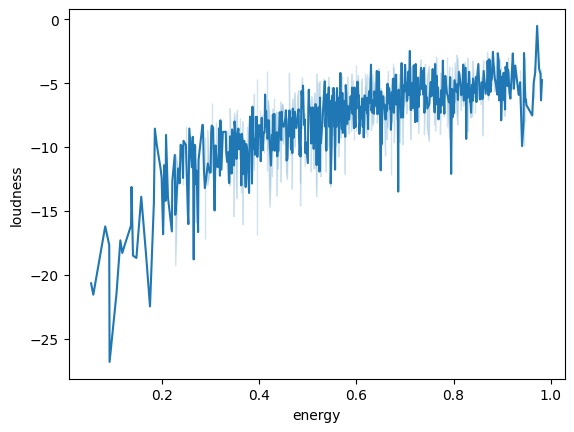

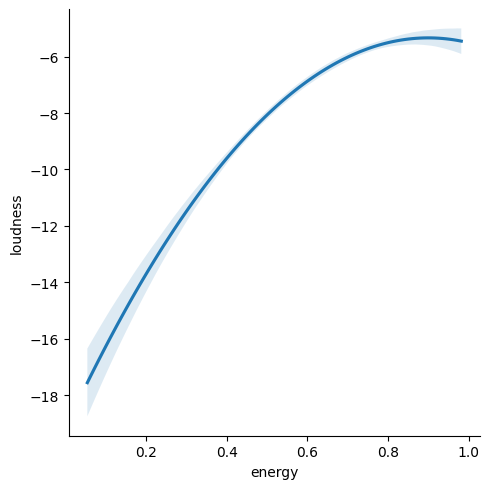

In [50]:
# Energy vs Loudness
# Line Plot
sns.lineplot(data=df1, x='energy', y='loudness')
plt.show()

# LM Plot
sns.lmplot(data=df1, x='energy', y='loudness', order = 2, scatter = False)
plt.show()

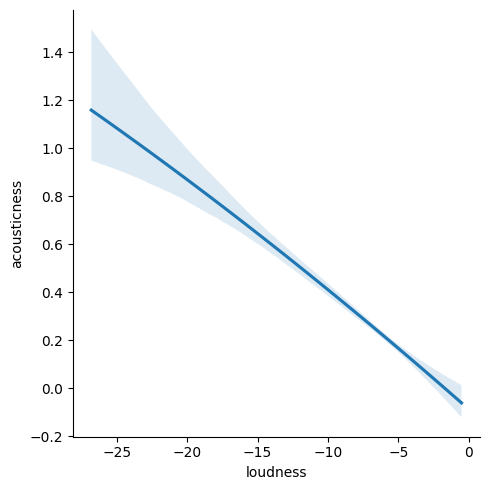

In [52]:
# Acousticness vs Loudness
# LM Plot
sns.lmplot(data=df1, x='loudness', y='acousticness', order = 2, scatter = False)
plt.show()

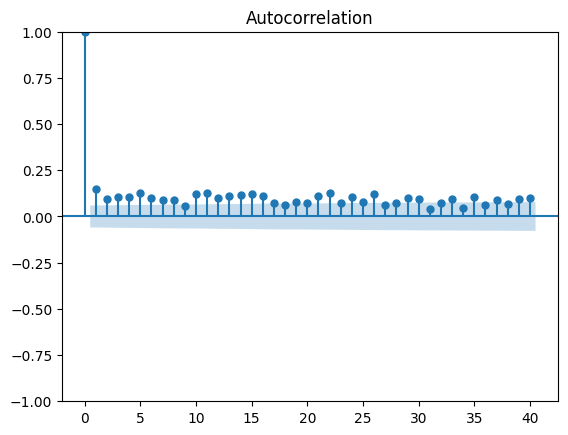

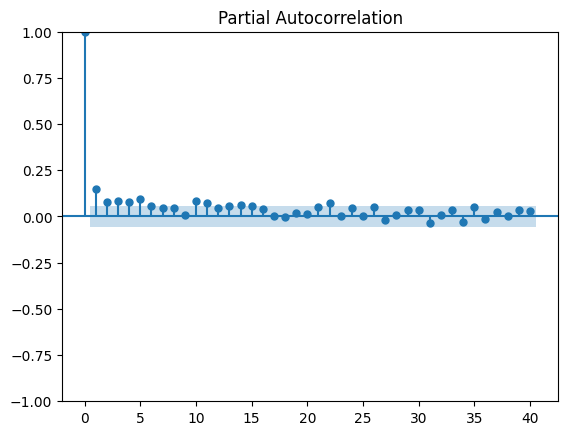

In [37]:
# MAYBE
# Release Date with Track Popularity
df_new = df1.sort_values(by = ['ReleaseDate'])
# df_new
plot_acf(df_new['TrackPopularity'].values.squeeze(), lags=40)
plot_pacf(df_new['TrackPopularity'].values.squeeze(), lags=40, method='ols')
plt.show()

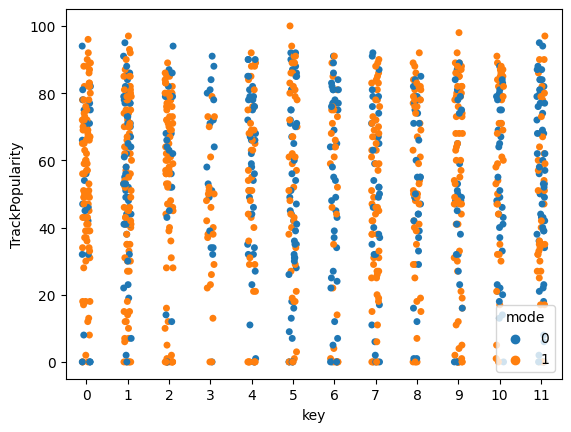

In [54]:
# Key relationship with track popularity
sns.stripplot(data=df1, x='key', y='TrackPopularity', hue = 'mode')
plt.show()

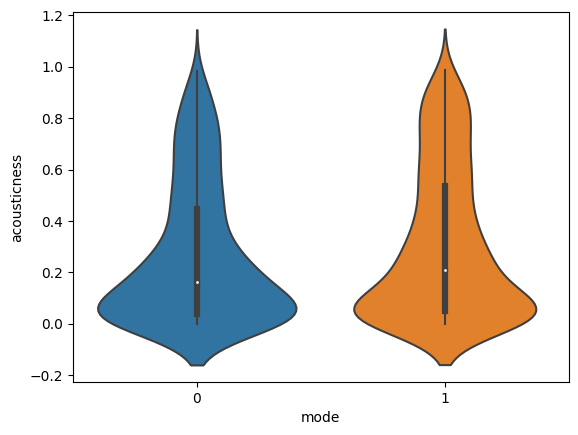

In [63]:
# Mode vs Acousticness
sns.violinplot(data=df1, x='mode', y='acousticness')
plt.show()

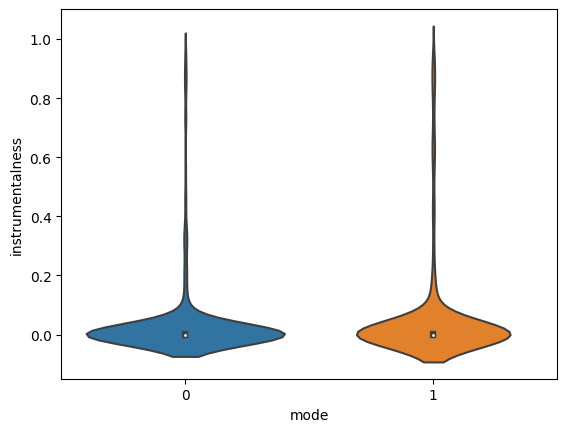

In [68]:
# Mode vs Instrumentalness
sns.violinplot(data=df1, x='mode', y='instrumentalness')
plt.show()

# Modelling

In [422]:
y = df1['TrackPopularity']
X = df1.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'])
X

,ArtistPopularity,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,66,True,0.551,0.677,2,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,62,False,0.763,0.468,11,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,74,True,0.490,0.373,8,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,64,False,0.633,0.643,0,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,60,False,0.696,0.354,6,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,78,False,0.694,0.605,11,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,89,True,0.734,0.450,6,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,100,False,0.502,0.534,2,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,72,False,0.604,0.592,5,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [423]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [424]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 358.90347914718853
R-squared: 0.4843060266748741


In [17]:
from sklearn.ensemble import RandomForestRegressor
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)


In [18]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 332.0368356164383
R-squared: 0.5229096261306498


In [408]:
y = df1['TrackPopularity']
X = df1.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'])
X

,ArtistPopularity,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,66,True,0.551,0.677,2,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,62,False,0.763,0.468,11,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,74,True,0.490,0.373,8,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,64,False,0.633,0.643,0,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,60,False,0.696,0.354,6,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,78,False,0.694,0.605,11,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,89,True,0.734,0.450,6,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,100,False,0.502,0.534,2,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,72,False,0.604,0.592,5,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [425]:
#X['ArtistPopularity_Explicit_Interaction'] = X['ArtistPopularity'] * X['Explicit']
X['ArtistPopularity_Danceability_Interaction'] = X['ArtistPopularity'] * X['danceability']
X['ArtistPopularity_Loudness_Interaction'] = X['ArtistPopularity'] * X['loudness']
X['Danceability_Loudness_Interaction'] = X['danceability'] * X['loudness']
X['ArtistPopularity_Energy_Interaction'] = X['energy'] * X['ArtistPopularity']
X['explicit_speech_int'] = X['Explicit'] * X['speechiness'] 
X['acousticness_energy_int'] = X['acousticness'] * X['energy']
X['tempo_artisti_pop_int'] = X['tempo'] * X['ArtistPopularity']
X['tempo_dance_energy_int'] = X['danceability'] * X['tempo'] * X['energy'] * X['loudness']

In [426]:
X

,ArtistPopularity,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,duration_ms,time_signature,ArtistPopularity_Danceability_Interaction,ArtistPopularity_Loudness_Interaction,Danceability_Loudness_Interaction,ArtistPopularity_Energy_Interaction,explicit_speech_int,acousticness_energy_int,tempo_artisti_pop_int,tempo_dance_energy_int
0,66,True,0.551,0.677,2,-7.311,1,0.0665,0.0173,0.000000,...,119120,4,36.366,-482.526,-4.028361,44.682,0.0665,0.011712,7023.324,-290.212303
1,62,False,0.763,0.468,11,-13.288,0,0.1290,0.1460,0.869000,...,134853,3,47.306,-823.856,-10.138744,29.016,0.0000,0.068328,6051.138,-463.100637
2,74,True,0.490,0.373,8,-9.762,1,0.2600,0.1010,0.000105,...,255680,4,36.260,-722.388,-4.783380,27.602,0.2600,0.037673,9019.786,-217.474444
3,64,False,0.633,0.643,0,-8.122,1,0.0252,0.1060,0.008310,...,130385,4,40.512,-519.808,-5.141226,41.152,0.0000,0.068158,6645.888,-343.281747
4,60,False,0.696,0.354,6,-14.043,0,0.0353,0.7670,0.001580,...,227027,4,41.760,-842.580,-9.773928,21.240,0.0000,0.271518,7196.280,-414.981943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,78,False,0.694,0.605,11,-5.621,1,0.0289,0.0756,0.000008,...,191721,4,54.132,-438.438,-3.900974,47.190,0.0000,0.045738,9508.668,-287.709043
1087,89,True,0.734,0.450,6,-7.075,1,0.0824,0.5970,0.000007,...,216853,4,65.326,-629.675,-5.193050,40.050,0.0824,0.268650,12020.963,-315.634358
1088,100,False,0.502,0.534,2,-5.954,1,0.0278,0.0399,0.000000,...,299080,4,50.200,-595.400,-2.988908,53.400,0.0000,0.021307,9405.000,-150.111030
1089,72,False,0.604,0.592,5,-7.263,0,0.0944,0.3120,0.000424,...,196697,4,43.488,-522.936,-4.386852,42.624,0.0000,0.184704,6462.000,-233.082220


In [427]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [428]:
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 359.36477951653296
R-squared: 0.48364320272864536


In [414]:
y = df1['TrackPopularity']
X = df1.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'])

#X['ArtistPopularity_Explicit_Interaction'] = X['ArtistPopularity'] * X['Explicit']
X['ArtistPopularity_Danceability_Interaction'] = X['ArtistPopularity'] * X['danceability']
X['ArtistPopularity_Loudness_Interaction'] = X['ArtistPopularity'] * X['loudness']
X['Danceability_Loudness_Interaction'] = X['danceability'] * X['loudness']
X['ArtistPopularity_Energy_Interaction'] = X['energy'] * X['ArtistPopularity']
#X['explicit_speech_int'] = X['Explicit'] * X['speechiness']
X['acousticness_energy_int'] = X['acousticness'] * X['energy']
X['tempo_artisti_pop_int'] = X['tempo'] * X['ArtistPopularity']
X['tempo_dance_energy_int'] = X['danceability'] * X['tempo'] * X['energy'] * X['loudness']

In [429]:
from sklearn.ensemble import RandomForestRegressor
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 327.35518767123284
R-squared: 0.5296364977572752


In [416]:
df_checker = pd.DataFrame()
df_checker['y_test'] = y_test
df_checker['y_pred'] = y_pred
df_checker

,y_test,y_pred
852,0,0.43
941,0,0.33
1085,0,0.80
1006,1,0.83
761,0,0.44
...,...,...
365,0,0.27
739,0,0.35
2,1,0.87
6,1,0.74


In [336]:
df['TrackPopularity'].value_counts()

0      86
79     27
78     27
82     23
71     23
       ..
98      1
96      1
100     1
9       1
93      1
Name: TrackPopularity, Length: 100, dtype: int64

## REGRESSION: REMOVING 0

In [339]:
df_n0 = df.drop(['URI', 'ArtistURI', 'uri', 'id', 'type', 'track_href', 'analysis_url'], axis = 1)
df_n0 = df_n0[df_n0['TrackPopularity'] != 0]

y = df_n0['TrackPopularity']
X = df_n0.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'])
X

,ArtistPopularity,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,66,True,0.551,0.677,2,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,62,False,0.763,0.468,11,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,74,True,0.490,0.373,8,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,64,False,0.633,0.643,0,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,60,False,0.696,0.354,6,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,78,False,0.694,0.605,11,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,89,True,0.734,0.450,6,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,100,False,0.502,0.534,2,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,72,False,0.604,0.592,5,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [343]:
# y

In [344]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 347.16220245657956
R-squared: 0.40480377916312615


In [346]:
#X['ArtistPopularity_Explicit_Interaction'] = X['ArtistPopularity'] * X['Explicit']
X['ArtistPopularity_Danceability_Interaction'] = X['ArtistPopularity'] * X['danceability']
X['ArtistPopularity_Loudness_Interaction'] = X['ArtistPopularity'] * X['loudness']
X['Danceability_Loudness_Interaction'] = X['danceability'] * X['loudness']
X['ArtistPopularity_Energy_Interaction'] = X['energy'] * X['ArtistPopularity']
#X['explicit_speech_int'] = X['Explicit'] * X['speechiness']
X['acousticness_energy_int'] = X['acousticness'] * X['energy']
X['tempo_artisti_pop_int'] = X['tempo'] * X['ArtistPopularity']
X['tempo_dance_energy_int'] = X['danceability'] * X['tempo'] * X['energy'] * X['loudness']

In [347]:
from sklearn.ensemble import RandomForestRegressor
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 366.4491059701493
R-squared: 0.3717371261643515


In [348]:
df_checker = pd.DataFrame()
df_checker['y_test'] = y_test
df_checker['y_pred'] = y_pred
df_checker

,y_test,y_pred
1011,6,8.03
637,43,35.48
695,32,41.96
516,48,45.90
366,49,38.26
...,...,...
208,40,41.27
828,48,64.02
335,81,62.13
210,47,42.05


## > 50 : Hit Song

In [353]:
df1 = df.drop(['URI', 'ArtistURI', 'uri', 'id', 'type', 'track_href', 'analysis_url'], axis = 1)
df11 = df1
df3 = df11
df3['TrackPopularity'] = df11['TrackPopularity'].apply(lambda x: 1 if x > 50 else 0)

In [354]:
df3

,TrackName,ArtistName,ArtistPopularity,ArtistGenres,Album,TrackPopularity,Explicit,ReleaseDate,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,ecstacy (slowed),SUICIDAL-IDOL,66,['scenecore'],ecstacy (slowed),1,True,2023-06-06,0.551,0.677,...,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,Le Monde,Richard Carter,62,[],Talk to Me (Original Soundtrack),1,False,2023-08-04,0.763,0.468,...,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,Tumblr Girls (feat. Christoph Andersson),G-Eazy,74,"['indie pop rap', 'oakland hip hop', 'pop rap'...",These Things Happen,1,True,2014-06-20,0.490,0.373,...,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,Wasted Summers,juju<3,64,[],Wasted Summers,1,False,2023-07-12,0.633,0.643,...,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,Amour plastique,Videoclub,60,"['french indie pop', 'french synthpop']",Euphories,1,False,2021-01-29,0.696,0.354,...,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,Carefully,Demi Lovato,78,"['pop', 'post-teen pop']",Dancing With The Devil…The Art of Starting Ove...,0,False,2021-04-05,0.694,0.605,...,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,Love To Dream,Doja Cat,89,"['dance pop', 'pop']",Planet Her (Deluxe),1,True,2021-06-27,0.734,0.450,...,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,The Last Time (feat. Gary Lightbody of Snow Pa...,Taylor Swift,100,['pop'],Red (Taylor's Version),1,False,2021-11-12,0.502,0.534,...,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,Box In The Ocean,Alessia Cara,72,"['canadian contemporary r&b', 'canadian pop', ...",In The Meantime,0,False,2021-09-24,0.604,0.592,...,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [355]:
y = df3['TrackPopularity']
X = df3.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'])

In [356]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import r2_score
model = LogisticRegression()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model.fit(X_train, y_train)


y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')
print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{conf_matrix}')

Accuracy: 0.771689497716895
              precision    recall  f1-score   support

           0       0.78      0.69      0.73       100
           1       0.76      0.84      0.80       119

    accuracy                           0.77       219
   macro avg       0.77      0.77      0.77       219
weighted avg       0.77      0.77      0.77       219

Confusion Matrix:
[[ 69  31]
 [ 19 100]]


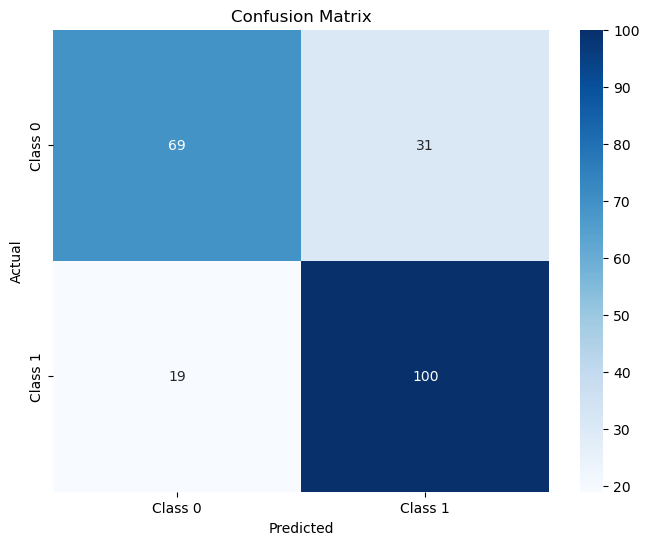

In [357]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

def plot_confusion_matrix(cm, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Define the class labels (e.g., 'Class 0', 'Class 1')
class_labels = ['Class 0', 'Class 1']

# Plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [358]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


adaboost_classifier = AdaBoostClassifier(n_estimators=500)
adaboost_classifier.fit(X_train, y_train)

y_pred = adaboost_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy*100}")
print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{conf_matrix}')

Accuracy: 80.82191780821918
              precision    recall  f1-score   support

           0       0.82      0.74      0.78       100
           1       0.80      0.87      0.83       119

    accuracy                           0.81       219
   macro avg       0.81      0.80      0.80       219
weighted avg       0.81      0.81      0.81       219

Confusion Matrix:
[[ 74  26]
 [ 16 103]]


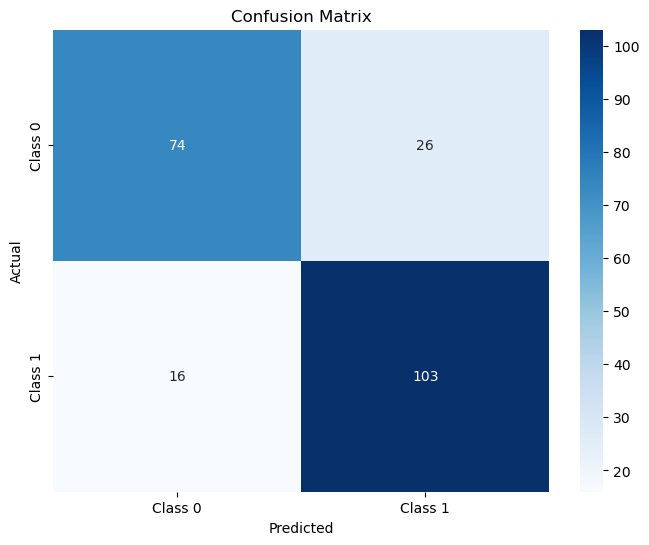

In [359]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

def plot_confusion_matrix(cm, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Define the class labels (e.g., 'Class 0', 'Class 1')
class_labels = ['Class 0', 'Class 1']

# Plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


In [68]:
df1

,TrackName,ArtistName,ArtistPopularity,ArtistGenres,Album,TrackPopularity,Explicit,ReleaseDate,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,ecstacy (slowed),SUICIDAL-IDOL,66,[scenecore],ecstacy (slowed),0,True,2023-06-06,0.551,0.677,...,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,Le Monde,Richard Carter,62,[],Talk to Me (Original Soundtrack),0,False,2023-08-04,0.763,0.468,...,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,Tumblr Girls (feat. Christoph Andersson),G-Eazy,74,"[indie pop rap, oakland hip hop, pop rap, rap]",These Things Happen,0,True,2014-06-20,0.490,0.373,...,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,Wasted Summers,juju<3,64,[],Wasted Summers,0,False,2023-07-12,0.633,0.643,...,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,Amour plastique,Videoclub,60,"[french indie pop, french synthpop]",Euphories,0,False,2021-01-29,0.696,0.354,...,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,Carefully,Demi Lovato,78,"[pop, post-teen pop]",Dancing With The Devil…The Art of Starting Ove...,0,False,2021-04-05,0.694,0.605,...,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,Love To Dream,Doja Cat,89,"[dance pop, pop]",Planet Her (Deluxe),0,True,2021-06-27,0.734,0.450,...,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,The Last Time (feat. Gary Lightbody of Snow Pa...,Taylor Swift,100,[pop],Red (Taylor's Version),0,False,2021-11-12,0.502,0.534,...,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,Box In The Ocean,Alessia Cara,72,"[canadian contemporary r&b, canadian pop, pop]",In The Meantime,0,False,2021-09-24,0.604,0.592,...,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [362]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Create the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

# Train the model
rf_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.817351598173516


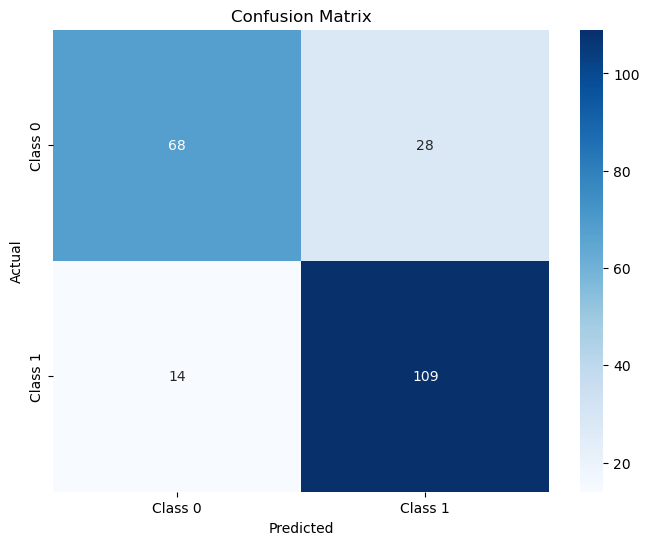

In [361]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred)

def plot_confusion_matrix(cm, labels):
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

# Define the class labels (e.g., 'Class 0', 'Class 1')
class_labels = ['Class 0', 'Class 1']

# Plot the confusion matrix
plot_confusion_matrix(cm, class_labels)


### INTRODUCING INTERACTION

In [363]:
df1 = df.drop(['URI', 'ArtistURI', 'uri', 'id', 'type', 'track_href', 'analysis_url'], axis = 1)
df3 = df1
df3['TrackPopularity'] = df1['TrackPopularity'].apply(lambda x: 1 if x > 51 else 0)
y = df3['TrackPopularity']
X = df3.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'])
X

,ArtistPopularity,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,66,True,0.551,0.677,2,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,62,False,0.763,0.468,11,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,74,True,0.490,0.373,8,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,64,False,0.633,0.643,0,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,60,False,0.696,0.354,6,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,78,False,0.694,0.605,11,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,89,True,0.734,0.450,6,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,100,False,0.502,0.534,2,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,72,False,0.604,0.592,5,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [364]:
#X['ArtistPopularity_Explicit_Interaction'] = X['ArtistPopularity'] * X['Explicit']
X['ArtistPopularity_Danceability_Interaction'] = X['ArtistPopularity'] * X['danceability']
X['ArtistPopularity_Loudness_Interaction'] = X['ArtistPopularity'] * X['loudness']
X['Danceability_Loudness_Interaction'] = X['danceability'] * X['loudness']
X['ArtistPopularity_Energy_Interaction'] = X['energy'] * X['ArtistPopularity']
#X['energy_loudness_int'] = X['energy'] * X['loudness']
X['acousticness_energy_int'] = X['acousticness'] * X['energy']
X['tempo_artisti_pop_int'] = X['tempo'] * X['ArtistPopularity']
X['tempo_dance_energy_int'] = X['danceability'] * X['tempo'] * X['energy'] * X['loudness']

In [365]:
X

,ArtistPopularity,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,...,tempo,duration_ms,time_signature,ArtistPopularity_Danceability_Interaction,ArtistPopularity_Loudness_Interaction,Danceability_Loudness_Interaction,ArtistPopularity_Energy_Interaction,acousticness_energy_int,tempo_artisti_pop_int,tempo_dance_energy_int
0,66,True,0.551,0.677,2,-7.311,1,0.0665,0.0173,0.000000,...,106.414,119120,4,36.366,-482.526,-4.028361,44.682,0.011712,7023.324,-290.212303
1,62,False,0.763,0.468,11,-13.288,0,0.1290,0.1460,0.869000,...,97.599,134853,3,47.306,-823.856,-10.138744,29.016,0.068328,6051.138,-463.100637
2,74,True,0.490,0.373,8,-9.762,1,0.2600,0.1010,0.000105,...,121.889,255680,4,36.260,-722.388,-4.783380,27.602,0.037673,9019.786,-217.474444
3,64,False,0.633,0.643,0,-8.122,1,0.0252,0.1060,0.008310,...,103.842,130385,4,40.512,-519.808,-5.141226,41.152,0.068158,6645.888,-343.281747
4,60,False,0.696,0.354,6,-14.043,0,0.0353,0.7670,0.001580,...,119.938,227027,4,41.760,-842.580,-9.773928,21.240,0.271518,7196.280,-414.981943
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,78,False,0.694,0.605,11,-5.621,1,0.0289,0.0756,0.000008,...,121.906,191721,4,54.132,-438.438,-3.900974,47.190,0.045738,9508.668,-287.709043
1087,89,True,0.734,0.450,6,-7.075,1,0.0824,0.5970,0.000007,...,135.067,216853,4,65.326,-629.675,-5.193050,40.050,0.268650,12020.963,-315.634358
1088,100,False,0.502,0.534,2,-5.954,1,0.0278,0.0399,0.000000,...,94.050,299080,4,50.200,-595.400,-2.988908,53.400,0.021307,9405.000,-150.111030
1089,72,False,0.604,0.592,5,-7.263,0,0.0944,0.3120,0.000424,...,89.750,196697,4,43.488,-522.936,-4.386852,42.624,0.184704,6462.000,-233.082220


In [372]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
adaboost_classifier = AdaBoostClassifier(n_estimators=500)
adaboost_classifier.fit(X_train, y_train)

y_pred = adaboost_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy*100}")
print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{conf_matrix}')

Accuracy: 84.47488584474885
              precision    recall  f1-score   support

           0       0.85      0.80      0.83       102
           1       0.84      0.88      0.86       117

    accuracy                           0.84       219
   macro avg       0.85      0.84      0.84       219
weighted avg       0.85      0.84      0.84       219

Confusion Matrix:
[[ 82  20]
 [ 14 103]]


In [371]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

adaboost_classifier = AdaBoostClassifier(n_estimators=500)

adaboost_classifier.fit(X_train, y_train)
scores = cross_val_score(adaboost_classifier, X, y, cv=10)


print("Cross-Validation Scores:", scores)
print("Mean Accuracy: {:.2f}%".format(scores.mean() * 100))
print("Standard Deviation: {:.2f}".format(scores.std()))


Cross-Validation Scores: [0.88181818 0.74311927 0.79816514 0.88073394 0.77981651 0.77981651
 0.78899083 0.71559633 0.68807339 0.67889908]
Mean Accuracy: 77.35%
Standard Deviation: 0.07


In [152]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import r2_score
model = LogisticRegression()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model.fit(X_train, y_train)


y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy*100}')
print(classification_report(y_test, y_pred))
conf_matrix = confusion_matrix(y_test, y_pred)
print(f'Confusion Matrix:\n{conf_matrix}')

Accuracy: 82.64840182648402
              precision    recall  f1-score   support

           0       0.83      0.78      0.81       102
           1       0.82      0.86      0.84       117

    accuracy                           0.83       219
   macro avg       0.83      0.82      0.82       219
weighted avg       0.83      0.83      0.83       219

Confusion Matrix:
[[ 80  22]
 [ 16 101]]


C:\Users\Uma Bala\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [368]:
scores = cross_val_score(model, X, y, cv=10)

print("Cross-Validation Scores:", scores)
print("Mean Accuracy: {:.2f}%".format(scores.mean() * 100))
print("Standard Deviation: {:.2f}".format(scores.std()))

C:\Users\Uma Bala\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Cross-Validation Scores: [0.82727273 0.83486239 0.87155963 0.88073394 0.87155963 0.86238532
 0.82568807 0.68807339 0.72477064 0.71559633]
Mean Accuracy: 81.03%
Standard Deviation: 0.07


C:\Users\Uma Bala\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [373]:
# Import necessary libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Create the Random Forest classifier
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)

# Train the model
rf_classifier.fit(X_train, y_train)

# Make predictions on the test data
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


Accuracy: 0.821917808219178


In [370]:
scores = cross_val_score(rf_classifier, X, y, cv=10)

print("Cross-Validation Scores:", scores)
print("Mean Accuracy: {:.2f}%".format(scores.mean() * 100))
print("Standard Deviation: {:.2f}".format(scores.std()))

Cross-Validation Scores: [0.85454545 0.82568807 0.83486239 0.90825688 0.86238532 0.80733945
 0.85321101 0.69724771 0.72477064 0.66972477]
Mean Accuracy: 80.38%
Standard Deviation: 0.08


C:\Users\Uma Bala\AppData\Local\Temp\ipykernel_19976\1831528604.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df1.corr()


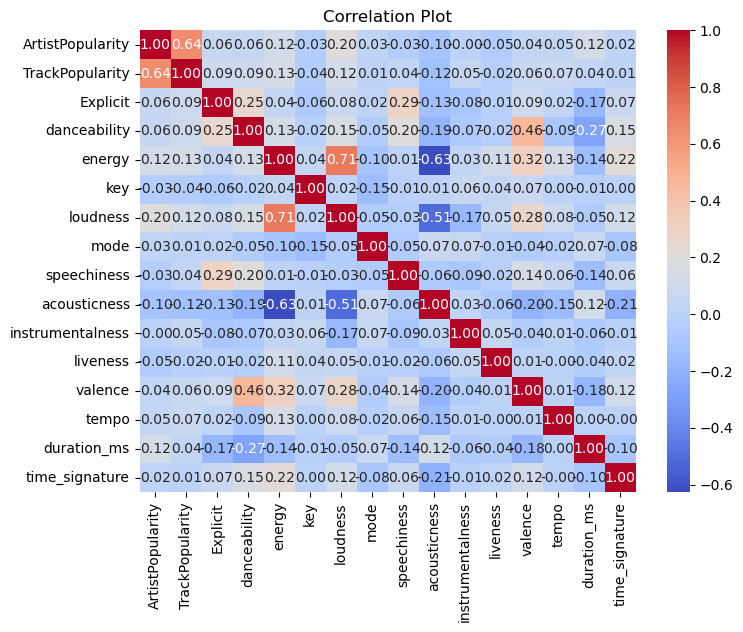

In [25]:
correlation_matrix = df1.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Plot')
plt.show()


In [26]:
df1

,TrackName,ArtistName,ArtistPopularity,ArtistGenres,Album,TrackPopularity,Explicit,ReleaseDate,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,ecstacy (slowed),SUICIDAL-IDOL,66,[scenecore],ecstacy (slowed),1,True,2023-06-06,0.551,0.677,...,-7.311,1,0.0665,0.0173,0.000000,0.3810,0.195,106.414,119120,4
1,Le Monde,Richard Carter,62,[],Talk to Me (Original Soundtrack),1,False,2023-08-04,0.763,0.468,...,-13.288,0,0.1290,0.1460,0.869000,0.1080,0.512,97.599,134853,3
2,Tumblr Girls (feat. Christoph Andersson),G-Eazy,74,"[indie pop rap, oakland hip hop, pop rap, rap]",These Things Happen,1,True,2014-06-20,0.490,0.373,...,-9.762,1,0.2600,0.1010,0.000105,0.1280,0.346,121.889,255680,4
3,Wasted Summers,juju<3,64,[],Wasted Summers,1,False,2023-07-12,0.633,0.643,...,-8.122,1,0.0252,0.1060,0.008310,0.7800,0.472,103.842,130385,4
4,Amour plastique,Videoclub,60,"[french indie pop, french synthpop]",Euphories,1,False,2021-01-29,0.696,0.354,...,-14.043,0,0.0353,0.7670,0.001580,0.1280,0.242,119.938,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,Carefully,Demi Lovato,78,"[pop, post-teen pop]",Dancing With The Devil…The Art of Starting Ove...,0,False,2021-04-05,0.694,0.605,...,-5.621,1,0.0289,0.0756,0.000008,0.1310,0.481,121.906,191721,4
1087,Love To Dream,Doja Cat,89,"[dance pop, pop]",Planet Her (Deluxe),1,True,2021-06-27,0.734,0.450,...,-7.075,1,0.0824,0.5970,0.000007,0.0964,0.529,135.067,216853,4
1088,The Last Time (feat. Gary Lightbody of Snow Pa...,Taylor Swift,100,[pop],Red (Taylor's Version),1,False,2021-11-12,0.502,0.534,...,-5.954,1,0.0278,0.0399,0.000000,0.0977,0.155,94.050,299080,4
1089,Box In The Ocean,Alessia Cara,72,"[canadian contemporary r&b, canadian pop, pop]",In The Meantime,0,False,2021-09-24,0.604,0.592,...,-7.263,0,0.0944,0.3120,0.000424,0.2690,0.583,89.750,196697,4


In [157]:
df1 = df1.drop(columns=['TrackPopularity','TrackName', 'ArtistName', 'ArtistGenres','Album','ReleaseDate'], axis = 1)

In [158]:
df11 = df1.iloc[1,:]
df12 = df1.iloc[2:,:]

In [159]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

input_record = df11
input_features = input_record.values.reshape(1,-1)  
similarities = cosine_similarity(input_features, df12) 
top_15_indices = similarities[0].argsort()[:-26:-1]


top_15_popularity = df.iloc[top_15_indices]['TrackPopularity']

average_popularity = top_15_popularity.mean()

print("Average Similar Track Popularity:", average_popularity)


Average Similar Track Popularity: 60.04


In [164]:
df

,URI,TrackName,ArtistURI,ArtistName,ArtistPopularity,ArtistGenres,Album,TrackPopularity,Explicit,ReleaseDate,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,spotify:track:1JgknGBbrfmEHeOZH051SS,ecstacy (slowed),spotify:artist:6KOszWgIriJLaPOySuBOTI,SUICIDAL-IDOL,66,['scenecore'],ecstacy (slowed),83,True,2023-06-06,...,0.3810,0.195,106.414,audio_features,1JgknGBbrfmEHeOZH051SS,spotify:track:1JgknGBbrfmEHeOZH051SS,https://api.spotify.com/v1/tracks/1JgknGBbrfmE...,https://api.spotify.com/v1/audio-analysis/1Jgk...,119120,4
1,spotify:track:424DkevE18QJazwlljiTD4,Le Monde,spotify:artist:6jlwBcuB3gOuSR4Hb6MmVU,Richard Carter,62,[],Talk to Me (Original Soundtrack),81,False,2023-08-04,...,0.1080,0.512,97.599,audio_features,424DkevE18QJazwlljiTD4,spotify:track:424DkevE18QJazwlljiTD4,https://api.spotify.com/v1/tracks/424DkevE18QJ...,https://api.spotify.com/v1/audio-analysis/424D...,134853,3
2,spotify:track:4Fv6wNYUixnYkj3Dgfrls8,Tumblr Girls (feat. Christoph Andersson),spotify:artist:02kJSzxNuaWGqwubyUba0Z,G-Eazy,74,"['indie pop rap', 'oakland hip hop', 'pop rap'...",These Things Happen,81,True,2014-06-20,...,0.1280,0.346,121.889,audio_features,4Fv6wNYUixnYkj3Dgfrls8,spotify:track:4Fv6wNYUixnYkj3Dgfrls8,https://api.spotify.com/v1/tracks/4Fv6wNYUixnY...,https://api.spotify.com/v1/audio-analysis/4Fv6...,255680,4
3,spotify:track:43MifzVnh8W3jJN0xqU9jR,Wasted Summers,spotify:artist:496w0Fyed8J7IRzn5Ffb6x,juju<3,64,[],Wasted Summers,83,False,2023-07-12,...,0.7800,0.472,103.842,audio_features,43MifzVnh8W3jJN0xqU9jR,spotify:track:43MifzVnh8W3jJN0xqU9jR,https://api.spotify.com/v1/tracks/43MifzVnh8W3...,https://api.spotify.com/v1/audio-analysis/43Mi...,130385,4
4,spotify:track:0HDO6JFfplYPrSWuufUosZ,Amour plastique,spotify:artist:3rp4f58JlRHkk8hpdLCer1,Videoclub,60,"['french indie pop', 'french synthpop']",Euphories,65,False,2021-01-29,...,0.1280,0.242,119.938,audio_features,0HDO6JFfplYPrSWuufUosZ,spotify:track:0HDO6JFfplYPrSWuufUosZ,https://api.spotify.com/v1/tracks/0HDO6JFfplYP...,https://api.spotify.com/v1/audio-analysis/0HDO...,227027,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1086,spotify:track:33g0C8tEICB7VgXawIGaQr,Carefully,spotify:artist:6S2OmqARrzebs0tKUEyXyp,Demi Lovato,78,"['pop', 'post-teen pop']",Dancing With The Devil…The Art of Starting Ove...,34,False,2021-04-05,...,0.1310,0.481,121.906,audio_features,33g0C8tEICB7VgXawIGaQr,spotify:track:33g0C8tEICB7VgXawIGaQr,https://api.spotify.com/v1/tracks/33g0C8tEICB7...,https://api.spotify.com/v1/audio-analysis/33g0...,191721,4
1087,spotify:track:0bOgWId7cFqBEKnlZct2q6,Love To Dream,spotify:artist:5cj0lLjcoR7YOSnhnX0Po5,Doja Cat,89,"['dance pop', 'pop']",Planet Her (Deluxe),52,True,2021-06-27,...,0.0964,0.529,135.067,audio_features,0bOgWId7cFqBEKnlZct2q6,spotify:track:0bOgWId7cFqBEKnlZct2q6,https://api.spotify.com/v1/tracks/0bOgWId7cFqB...,https://api.spotify.com/v1/audio-analysis/0bOg...,216853,4
1088,spotify:track:0y6kdSRCVQhSsHSpWvTUm7,The Last Time (feat. Gary Lightbody of Snow Pa...,spotify:artist:06HL4z0CvFAxyc27GXpf02,Taylor Swift,100,['pop'],Red (Taylor's Version),72,False,2021-11-12,...,0.0977,0.155,94.050,audio_features,0y6kdSRCVQhSsHSpWvTUm7,spotify:track:0y6kdSRCVQhSsHSpWvTUm7,https://api.spotify.com/v1/tracks/0y6kdSRCVQhS...,https://api.spotify.com/v1/audio-analysis/0y6k...,299080,4
1089,spotify:track:7bhR82JEE9bcX8iphymGme,Box In The Ocean,spotify:artist:2wUjUUtkb5lvLKcGKsKqsR,Alessia Cara,72,"['canadian contemporary r&b', 'canadian pop', ...",In The Meantime,41,False,2021-09-24,...,0.2690,0.583,89.750,audio_features,7bhR82JEE9bcX8iphymGme,spotify:track:7bhR82JEE9bcX8iphymGme,https://api.spotify.com/v1/tracks/7bhR82JEE9bc...,https://api.spotify.com/v1/audio-analysis/7bhR...,196697,4


In [30]:
similarities.shape

(1, 1089)

In [58]:
df11.shape

(15,)

In [59]:
df12.shape

(1089, 15)

In [43]:
similarities[:,:].argsort().shape

(872, 219)

In [39]:
y_test.shape

(219,)

In [45]:
similarities.shape

(872, 219)

In [56]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import numpy as np

mse_list = []

similarities = cosine_similarity(X_test, X_train)

for i in range(len(X_test)):
    top_15_indices = similarities[i].argsort()[:-11:-1]
    top_15_popularity = y_train.iloc[top_15_indices]
    average_popularity = top_15_popularity.mean()
    mse = mean_squared_error([y_test.values[i]], [average_popularity])
    mse_list.append(mse)

for i, mse in enumerate(mse_list):
    print(f"Mean Squared Error for record {i}: {mse}")


Mean Squared Error for record 0: 0.36
Mean Squared Error for record 1: 0.010000000000000002
Mean Squared Error for record 2: 0.6400000000000001
Mean Squared Error for record 3: 0.03999999999999998
Mean Squared Error for record 4: 0.09
Mean Squared Error for record 5: 0.0
Mean Squared Error for record 6: 0.09000000000000002
Mean Squared Error for record 7: 0.009999999999999995
Mean Squared Error for record 8: 0.09
Mean Squared Error for record 9: 0.48999999999999994
Mean Squared Error for record 10: 0.009999999999999995
Mean Squared Error for record 11: 0.0
Mean Squared Error for record 12: 0.16000000000000003
Mean Squared Error for record 13: 0.16000000000000003
Mean Squared Error for record 14: 0.48999999999999994
Mean Squared Error for record 15: 0.0
Mean Squared Error for record 16: 0.009999999999999995
Mean Squared Error for record 17: 0.25
Mean Squared Error for record 18: 0.16000000000000003
Mean Squared Error for record 19: 0.36
Mean Squared Error for record 20: 0.16000000000000

In [55]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import mean_squared_error
import pandas as pd
import numpy as np

similarities = cosine_similarity(X_test, X_train)

predicted_popularity_list = []
actual_popularity_list = []

for i in range(len(X_test)):

    top_15_indices = similarities[i].argsort()[:-11:-1]
    top_15_popularity = y_train.iloc[top_15_indices]
    average_popularity = top_15_popularity.mean()

    predicted_popularity_list.append(average_popularity)
    actual_popularity_list.append(y_test.values[i])

mse = mean_squared_error(actual_popularity_list, predicted_popularity_list)

print("Mean Squared Error for all records together:", mse)


Mean Squared Error for all records together: 0.16936073059360732


In [75]:
# Multi Layer Perceptrons (MLP): Deep Learning
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


scaler = StandardScaler().fit(X_train)
X_train2 = scaler.transform(X_train)
X_test2 = scaler.transform(X_test)

# Define the MLP model
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_dim=X_train2.shape[1]),  # Input layer
    keras.layers.Dense(32, activation='relu'),                              # Hidden layer
    keras.layers.Dense(1, activation='linear')                              # Output layer
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
model.fit(X_train2, y_train, epochs=100, batch_size=32, validation_data=(X_test2, y_test))

# Evaluate the model
loss, mae = model.evaluate(X_test2, y_test)
print(f"Mean Absolute Error on test data: {mae}")

# Predict with the model
y_pred = model.predict(X_test2)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Epoch 1/100
28/28 [==============================] - 2s 10ms/step - loss: 3423.5593 - mae: 51.8173 - val_loss: 3189.1963 - val_mae: 50.1721
Epoch 2/100
28/28 [==============================] - 0s 4ms/step - loss: 3190.5884 - mae: 49.9236 - val_loss: 2872.4827 - val_mae: 47.3492
Epoch 3/100
28/28 [==============================] - 0s 5ms/step - loss: 2783.9670 - mae: 46.5802 - val_loss: 2362.6128 - val_mae: 42.6837
Epoch 4/100
28/28 [==============================] - 0s 5ms/step - loss: 2181.9651 - mae: 41.1109 - val_loss: 1672.2928 - val_mae: 35.6929
Epoch 5/100
28/28 [==============================] - 0s 5ms/step - loss: 1452.8264 - mae: 33.3435 - val_loss: 996.8063 - val_mae: 27.1877
Epoch 6/100
28/28 [==============================] - 0s 4ms/step - loss: 881.2664 - mae: 25.6565 - val_loss: 627.5131 - val_mae: 20.7675
Epoch 7/100
28/28 [==============================] - 0s 4ms/step - loss: 613.7055 - mae: 20.4922 - val_loss: 530.5526 - val_mae: 18.2075
Epoch 8/100
28/28 [============

In [453]:
df_test = pd.read_csv("TEST_RECORDS.CSV")

In [445]:
df_test_orig = df_test

In [395]:
df_test = df_test.drop(['URI', 'ArtistURI', 'uri', 'id', 'type', 'track_href', 'analysis_url', 'Album', 'ArtistGenres', 'ArtistName', 'ReleaseDate','TrackName'], axis = 1)
#df_test['ArtistPopularity_Explicit_Interaction'] = df_test['ArtistPopularity'] * df_test['Explicit']
df_test['ArtistPopularity_Danceability_Interaction'] = df_test['ArtistPopularity'] * df_test['danceability']
df_test['ArtistPopularity_Loudness_Interaction'] = df_test['ArtistPopularity'] * df_test['loudness']
df_test['Danceability_Loudness_Interaction'] = df_test['danceability'] * df_test['loudness']
df_test['ArtistPopularity_Energy_Interaction'] = df_test['energy'] * df_test['ArtistPopularity']
#df_test['energy_loudness_int'] = df_test['energy'] * df_test['loudness']
df_test['acousticness_energy_int'] = df_test['acousticness'] * df_test['energy']
df_test['tempo_artisti_pop_int'] = df_test['tempo'] * df_test['ArtistPopularity']
df_test['tempo_dance_energy_int'] = df_test['danceability'] * df_test['tempo'] * df_test['energy'] * df_test['loudness']

In [398]:
predictions1 = rf_classifier.predict(df_test)

In [399]:
predictiondf = pd.DataFrame()
predictiondf['TrackName'] = df_test_orig['TrackName']
predictiondf['ArtistName'] = df_test_orig['ArtistName']
predictiondf['Hit/Flop?'] = predictions1

In [407]:
ans = predictiondf.sort_values(by = ['Hit/Flop?'], ascending = True)
ans.head(20)

,TrackName,ArtistName,Hit/Flop?
99,Infraliminal,REZZMAU5,0
75,mad's world,Mad Tsai,0
52,My Lady of Mercy,The Last Dinner Party,0
27,Regardless,Naomi Sharon,0
72,Something True,Gaidaa,0
71,5 to 8 Hours a Day (WWwaG),L'Rain,0
66,The Hills,Rachel Chinouriri,0
36,Turn Red,Mali Velasquez,0
37,Country Girl,Kylie Morgan,0
38,Catch Me,Mckenna Grace,0


In [448]:
df_test = df_test_orig
df_test = df_test.drop(['URI', 'ArtistURI', 'uri', 'id', 'type', 'track_href', 'analysis_url', 'Album', 'ArtistGenres', 'ArtistName', 'ReleaseDate','TrackName'], axis = 1)

#df_test['ArtistPopularity_Explicit_Interaction'] = df_test['ArtistPopularity'] * df_test['Explicit']
df_test['ArtistPopularity_Danceability_Interaction'] = df_test['ArtistPopularity'] * df_test['danceability']
df_test['ArtistPopularity_Loudness_Interaction'] = df_test['ArtistPopularity'] * df_test['loudness']
df_test['Danceability_Loudness_Interaction'] = df_test['danceability'] * df_test['loudness']
df_test['ArtistPopularity_Energy_Interaction'] = df_test['energy'] * df_test['ArtistPopularity']
df_test['explicit_speech_int'] = df_test['Explicit'] * df_test['speechiness']
df_test['acousticness_energy_int'] = df_test['acousticness'] * df_test['energy']
df_test['tempo_artisti_pop_int'] = df_test['tempo'] * df_test['ArtistPopularity']
df_test['tempo_dance_energy_int'] = df_test['danceability'] * df_test['tempo'] * df_test['energy'] * df_test['loudness']

In [450]:
predictions2 = model.predict(df_test)

In [451]:
predictiondf1 = pd.DataFrame()
predictiondf1['TrackName'] = df_test_orig['TrackName']
predictiondf1['ArtistName'] = df_test_orig['ArtistName']
predictiondf1['Hit/Flop?'] = predictions2

In [452]:
predictiondf1

,TrackName,ArtistName,Hit/Flop?
0,MONACO,Bad Bunny,68.42
1,SAY MY GRACE (feat. Travis Scott),Offset,69.49
2,Pretty Girl (with Rema),Ice Spice,81.93
3,One Of Your Girls,Troye Sivan,64.37
4,ten,Fred again..,75.57
...,...,...,...
95,Get Lucki,Veeze,60.29
96,Yes,Hunxho,41.86
97,Something,Layton Greene,33.21
98,Black Eye,Allie X,51.86


In [488]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Load your DataFrame (df_test and df12) if not already loaded

# Assuming df_test contains your input features, and df12 contains the features of other tracks

# Calculate cosine similarities between the input track and all other tracks
input_record = df_test.iloc[98, :]
input_features = [input_record.values]
similarities = cosine_similarity(input_features, df12)

# Get the indices of the top 10 most similar tracks (excluding the input track itself)
top_10_indices = similarities[0].argsort()[:-11:-1]

# Extract the popularity values for the top 10 similar tracks
top_10_popularity = df.iloc[top_10_indices]['TrackPopularity']

# Calculate the average popularity of the top 10 similar tracks
average_popularity = top_10_popularity.mean()

print("Average Similar Track Popularity:", average_popularity)


Average Similar Track Popularity: 35.3


In [459]:
input_record

ArtistPopularity         79
Explicit               True
danceability          0.773
energy                0.635
key                      10
loudness              -5.06
mode                      1
speechiness          0.0452
acousticness         0.0585
instrumentalness        0.0
liveness              0.132
valence               0.476
tempo               121.879
duration_ms          173253
time_signature            4
Name: 1, dtype: object

In [463]:
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Load your DataFrame (df_test and df12) if not already loaded

# Assuming df_test contains your input features, and df12 contains the features of other tracks

# Create an empty list to store average popularities for each track
average_popularities = []

for index, input_record in df_test.iterrows():
    # Calculate cosine similarities between the input track and all other tracks
    similarities = cosine_similarity([input_record], df12)

    # Get the indices of the top 15 most similar tracks (excluding the input track itself)
    top_15_indices = similarities[0].argsort()[:-16:-1]

    # Extract the popularity values for the top 15 similar tracks
    top_15_popularity = df.iloc[top_15_indices]['TrackPopularity']

    # Calculate the average popularity of the top 15 similar tracks
    average_popularity = top_15_popularity.mean()

    # Append the average popularity to the list
    average_popularities.append(average_popularity)

# Print the average popularity for each track
for i, avg_popularity in enumerate(average_popularities):
    print(f"Track {i + 1}: Average Similar Track Popularity: {avg_popularity}")


Track 1: Average Similar Track Popularity: 67.13333333333334
Track 2: Average Similar Track Popularity: 75.2
Track 3: Average Similar Track Popularity: 59.733333333333334
Track 4: Average Similar Track Popularity: 65.66666666666667
Track 5: Average Similar Track Popularity: 67.13333333333334
Track 6: Average Similar Track Popularity: 63.13333333333333
Track 7: Average Similar Track Popularity: 70.86666666666666
Track 8: Average Similar Track Popularity: 67.6
Track 9: Average Similar Track Popularity: 40.0
Track 10: Average Similar Track Popularity: 44.46666666666667
Track 11: Average Similar Track Popularity: 51.6
Track 12: Average Similar Track Popularity: 54.8
Track 13: Average Similar Track Popularity: 61.86666666666667
Track 14: Average Similar Track Popularity: 71.6
Track 15: Average Similar Track Popularity: 38.93333333333333
Track 16: Average Similar Track Popularity: 49.46666666666667
Track 17: Average Similar Track Popularity: 67.8
Track 18: Average Similar Track Popularity: 5

In [467]:
track_info_df

,TrackName,ArtistName,Popularity
0,Thinking with My Dick (feat. Juicy J),Kevin Gates,66
1,The Night We Met,Lord Huron,80
2,Superwoman,Alicia Keys,53
3,Kiss the Dark Goodbye,LUMRY,12
4,Tom's Diner,AnnenMayKantereit,75
...,...,...,...
995,DRIVE,VITA,27
996,Exhale,Sabrina Carpenter,59
997,Perfect,Selena Gomez,55
998,Ambitions,Dom Guyot,29


In [470]:
df_test_orig[df_test_orig['ArtistName'] == 'Kevin Gates']

,URI,TrackName,ArtistURI,ArtistName,ArtistPopularity,ArtistGenres,Album,Explicit,ReleaseDate,danceability,...,duration_ms,time_signature,ArtistPopularity_Danceability_Interaction,ArtistPopularity_Loudness_Interaction,Danceability_Loudness_Interaction,ArtistPopularity_Energy_Interaction,explicit_speech_int,acousticness_energy_int,tempo_artisti_pop_int,tempo_dance_energy_int
